In [1]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [4]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

In [5]:
from tensorflow.keras.layers import Conv2D, Dropout, MaxPool2D, UpSampling2D, Concatenate, Multiply, BatchNormalization, LeakyReLU
from tensorflow.keras.layers import Layer, Input, Add
from tensorflow.keras.callbacks import Callback
import matplotlib.pyplot as plt
import numpy as np

In [6]:
!pip install opencv-python

In [7]:
!pip install tf-explain

In [8]:
!pip install tensorflow

In [9]:
!pip install keras

In [10]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

In [11]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [12]:
SIZE = 256

In [13]:
root_path = 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\'
classes = sorted(os.listdir(root_path))
classes

['benign', 'malignant', 'normal']

In [14]:
for i in classes:
    print(i)

benign
malignant
normal


In [15]:
single=sorted([sorted(glob(root_path+'\\'+name+"/*mask.png")) for name in classes])

In [16]:
single

[['C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (1)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (10)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (100)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (101)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (102)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (103)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (104)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (105)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (106)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (107)_mask.png',
  '

In [17]:
single_mask_paths = sorted([sorted(glob(root_path + '\\'+name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path +'\\'+ name + "/*mask_1.png")) for name in classes])

In [18]:
single_mask_paths

[['C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (1)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (10)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (100)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (101)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (102)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (103)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (104)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (105)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (106)_mask.png',
  'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (107)_mask.png',
  '

In [19]:
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

In [20]:
image_paths

['C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (1).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (10).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (100).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (101).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (102).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (103).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (104).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (105).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (106).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\\\benign\\benign (107).png',
 'C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT

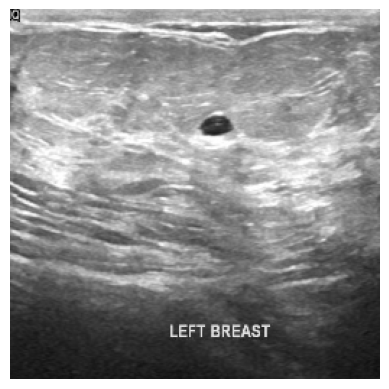

In [21]:
show_image(load_image(image_paths[0], SIZE))

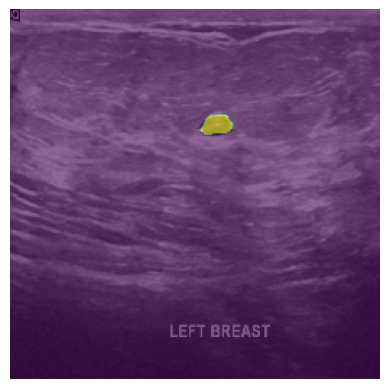

In [22]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

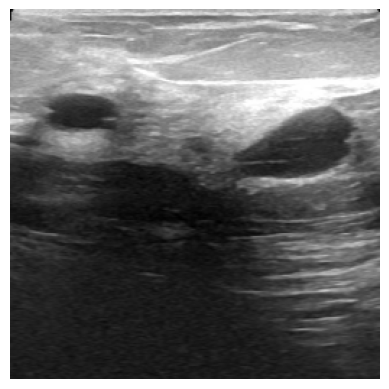

In [23]:
show_image(load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100).png', SIZE))

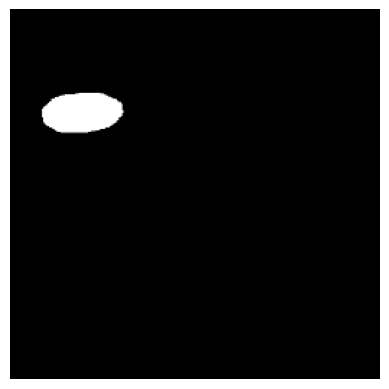

In [24]:
show_image(load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100)_mask_1.png', SIZE))

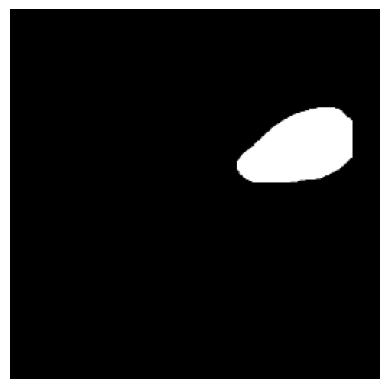

In [25]:
show_image(load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100)_mask.png', SIZE))

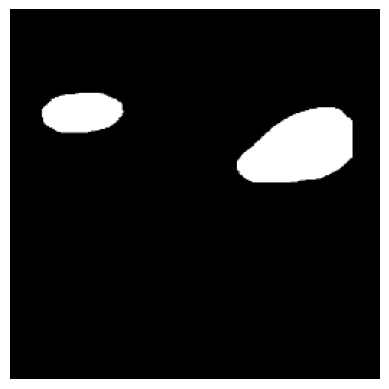

In [26]:
img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100)_mask_1.png', SIZE)
mask2 = load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100)_mask.png', SIZE)

img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='gray')

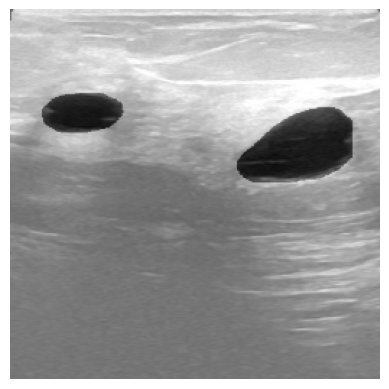

In [27]:
show_image(load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100).png', SIZE))
plt.imshow(img, cmap='binary', alpha=0.4)
plt.axis('off')
plt.show()

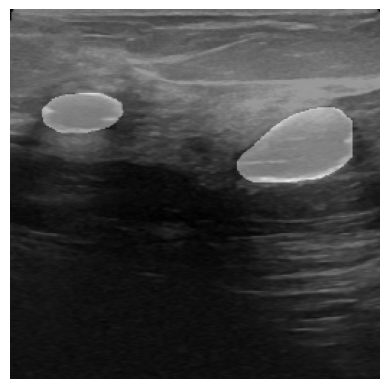

In [28]:
show_image(load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

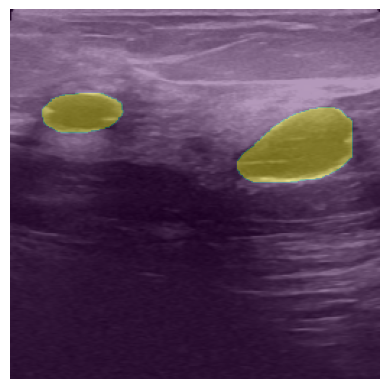

In [29]:
show_image(load_image('C:\\Users\\Dell\\Downloads\\archive (1)\\Dataset_BUSI_with_GT\\benign\\benign (100).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

In [30]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

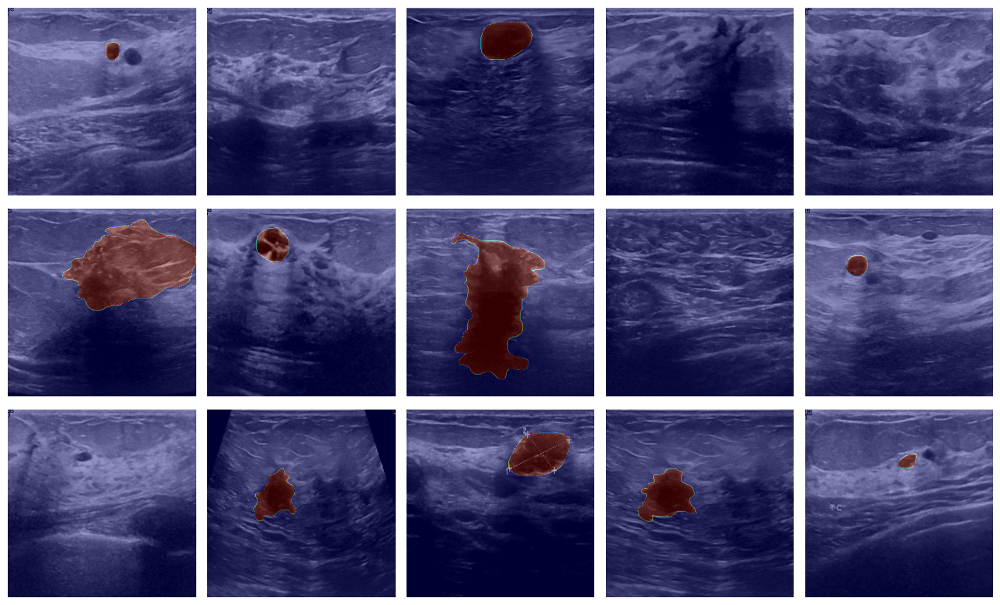

In [31]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

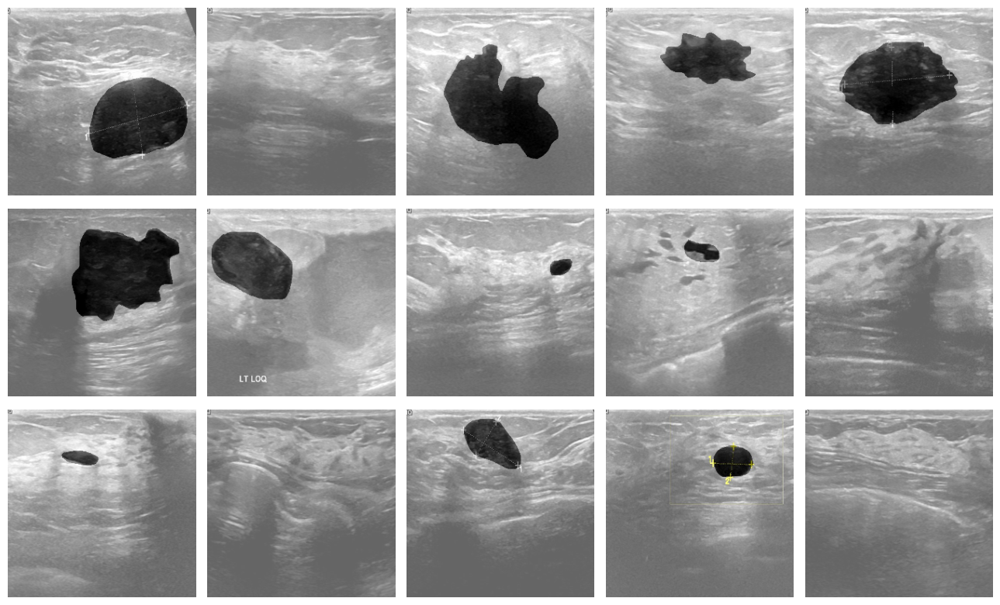

In [32]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

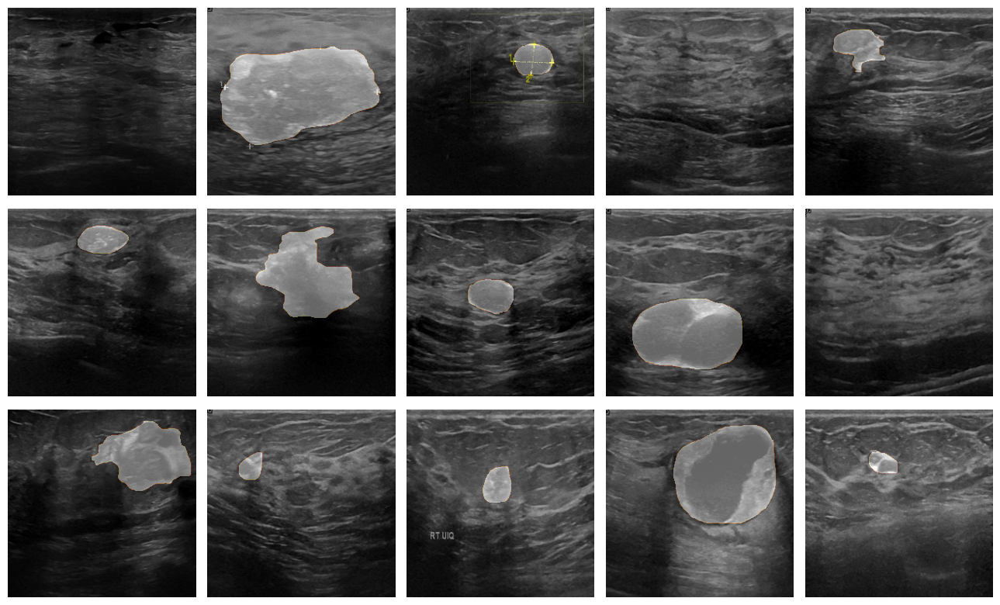

In [33]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

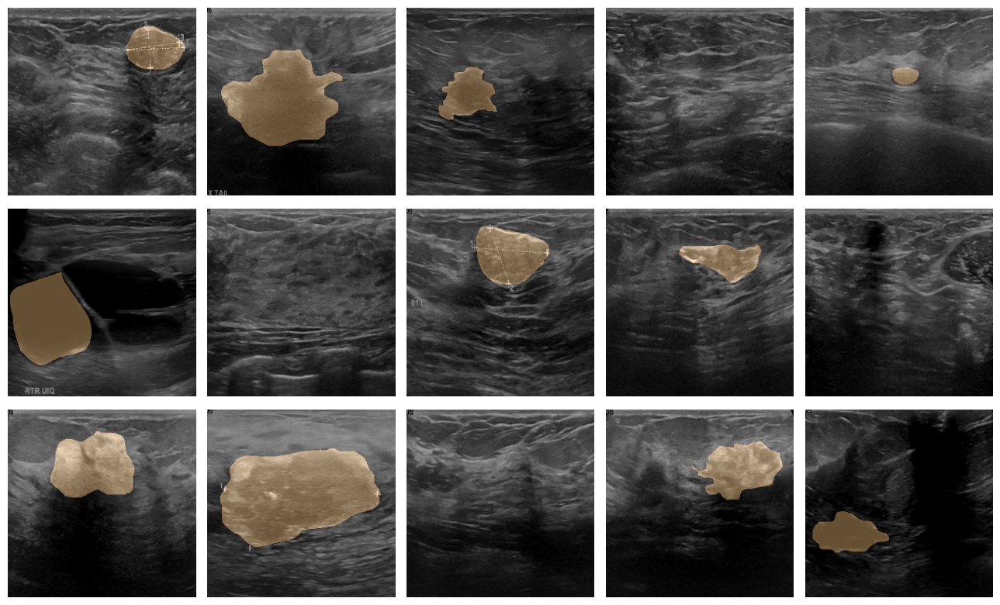

In [34]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

In [47]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal')
        self.activation1 = LeakyReLU(alpha=0.1)
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal')
        self.activation2 = LeakyReLU(alpha=0.1)
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.activation1(x)
        x = self.drop(x)
        x = self.c2(x)
        x = self.activation2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }


In [48]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = Concatenate()([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

In [49]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f

    def get_config(self):
        base_config = super(AttentionGate, self).get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }


In [50]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

In [51]:
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

Epoch 1/16
1/1 [==============================] - 1s 611ms/step loss: 13991.3281 - accuracy: 0.8746 - IoU: 0.45


C:\Users\Dell\anaconda3\lib\site-packages\tf_explain\utils\display.py:112: RuntimeWarning: invalid value encountered in divide
  heatmap = (heatmap - np.min(heatmap)) / (heatmap.max() - heatmap.min())


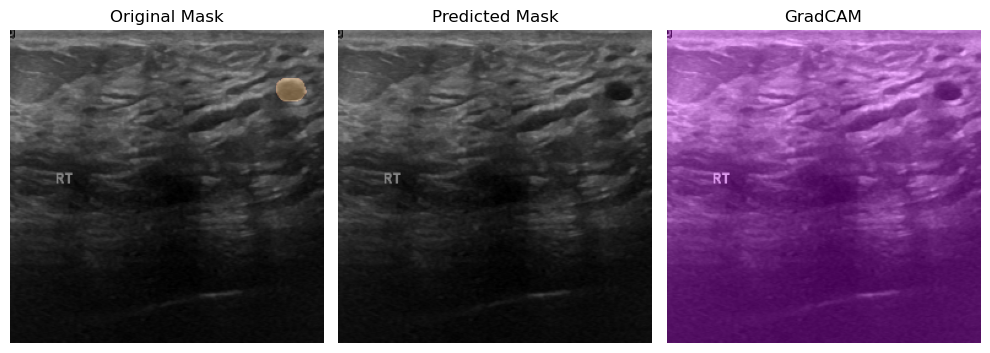

390/390 [==============================] - 1006s 3s/step - loss: 13991.3281 - accuracy: 0.8746 - IoU: 0.4546 - val_loss: 9353.5391 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/16
1/1 [==============================] - 0s 287ms/step loss: 33457.4961 - accuracy: 0.8095 - IoU: 0.43


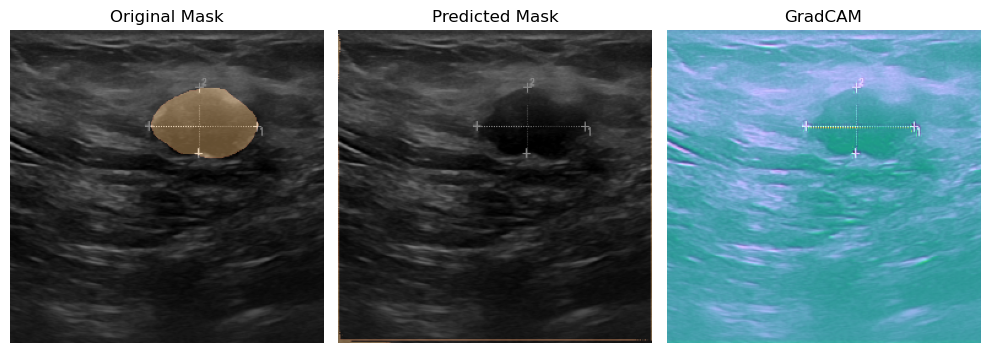

390/390 [==============================] - 1129s 3s/step - loss: 33457.4961 - accuracy: 0.8095 - IoU: 0.4310 - val_loss: 7.5084 - val_accuracy: 0.9717 - val_IoU: 0.4879
Epoch 3/16
1/1 [==============================] - 0s 242ms/step loss: 43.8801 - accuracy: 0.8170 - IoU: 0.44


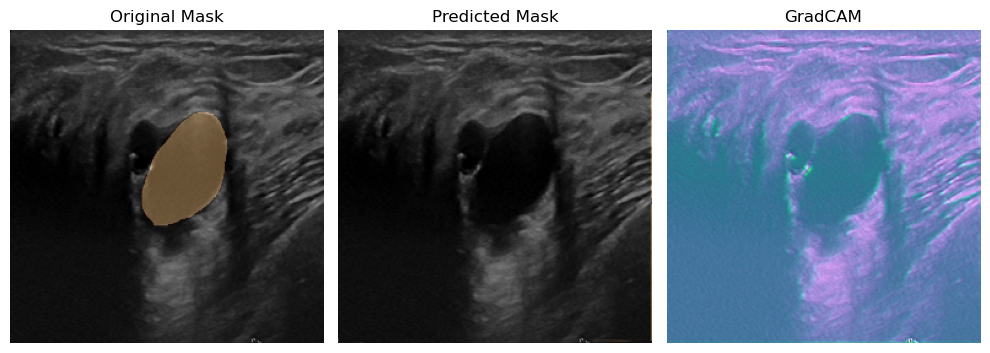

390/390 [==============================] - 1124s 3s/step - loss: 43.8801 - accuracy: 0.8170 - IoU: 0.4412 - val_loss: 3.5790 - val_accuracy: 0.9779 - val_IoU: 0.4894
Epoch 4/16
1/1 [==============================] - 0s 294ms/step loss: 19.8269 - accuracy: 0.8218 - IoU: 0.45


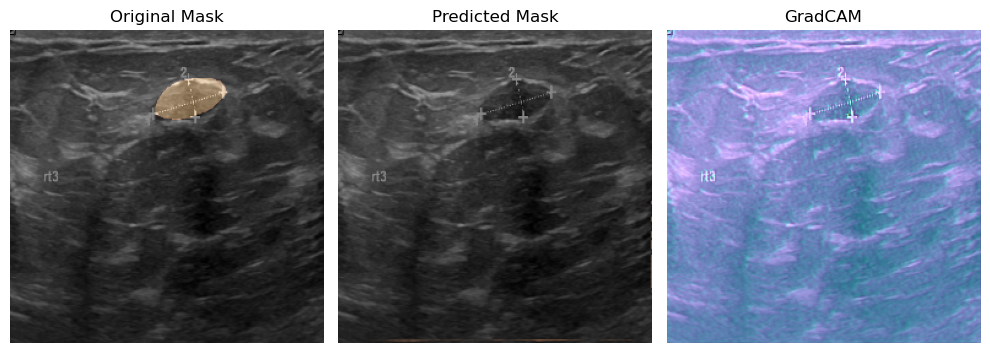

390/390 [==============================] - 1085s 3s/step - loss: 19.8269 - accuracy: 0.8218 - IoU: 0.4508 - val_loss: 3.8264 - val_accuracy: 0.9757 - val_IoU: 0.4900
Epoch 5/16
1/1 [==============================] - 0s 268ms/step loss: 11.9697 - accuracy: 0.8227 - IoU: 0.45


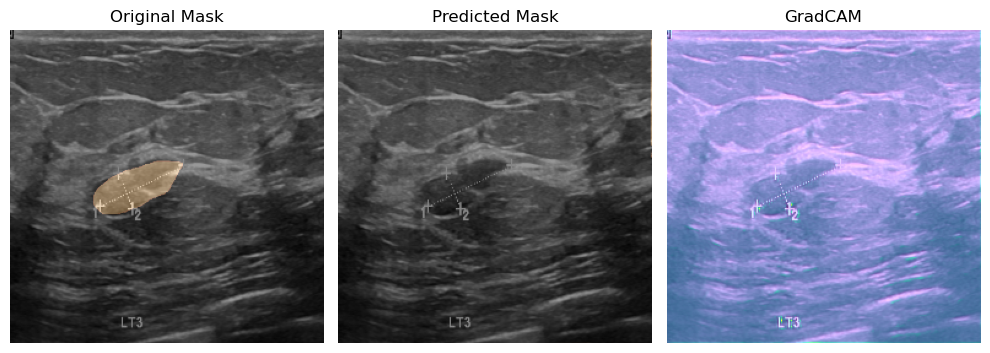

390/390 [==============================] - 911s 2s/step - loss: 11.9697 - accuracy: 0.8227 - IoU: 0.4564 - val_loss: 8.4128 - val_accuracy: 0.9790 - val_IoU: 0.4900
Epoch 6/16
1/1 [==============================] - 0s 495ms/step loss: 9.7206 - accuracy: 0.8374 - IoU: 0.46


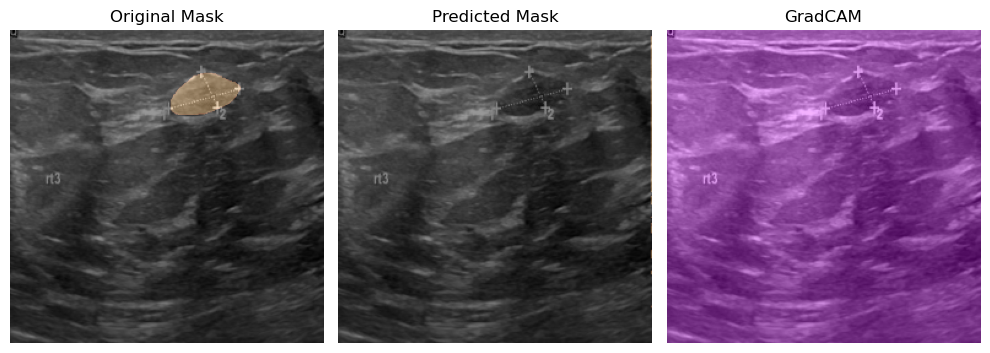

390/390 [==============================] - 1080s 3s/step - loss: 9.7206 - accuracy: 0.8374 - IoU: 0.4632 - val_loss: 35.8926 - val_accuracy: 0.9785 - val_IoU: 0.4896
Epoch 7/16
1/1 [==============================] - 0s 455ms/step loss: 8.2240 - accuracy: 0.8350 - IoU: 0.46


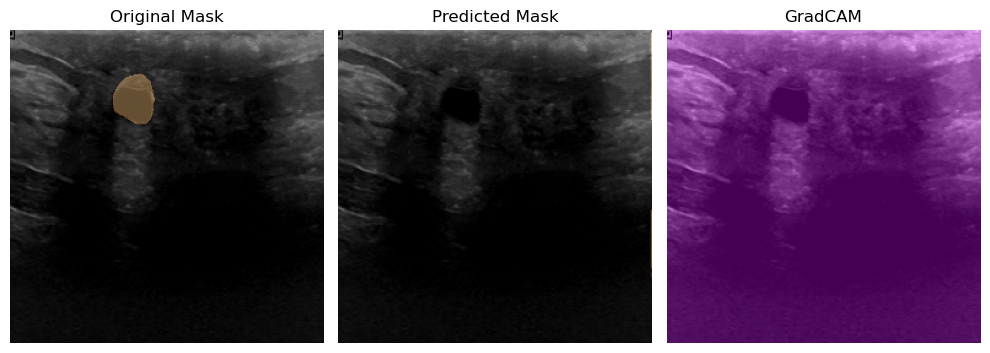

390/390 [==============================] - 1417s 4s/step - loss: 8.2240 - accuracy: 0.8350 - IoU: 0.4670 - val_loss: 20.2134 - val_accuracy: 0.9779 - val_IoU: 0.4895
Epoch 8/16
1/1 [==============================] - 0s 470ms/step loss: 4.2317 - accuracy: 0.8495 - IoU: 0.47


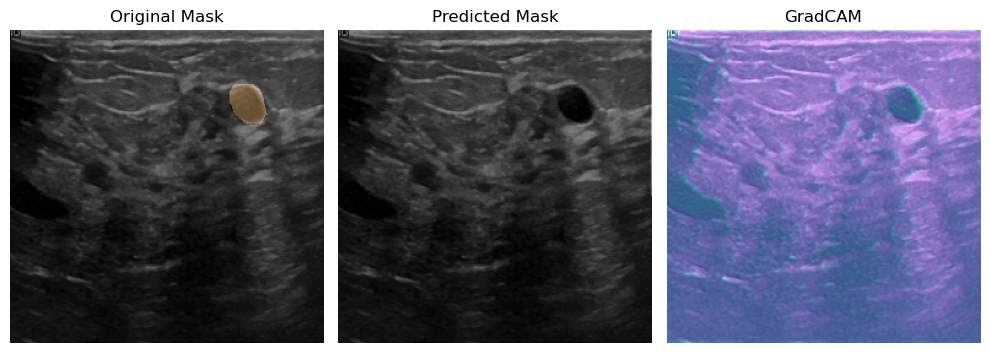

390/390 [==============================] - 1354s 3s/step - loss: 4.2317 - accuracy: 0.8495 - IoU: 0.4744 - val_loss: 14.6749 - val_accuracy: 0.9765 - val_IoU: 0.4890
Epoch 9/16
1/1 [==============================] - 0s 263ms/step loss: 3.1070 - accuracy: 0.8546 - IoU: 0.47


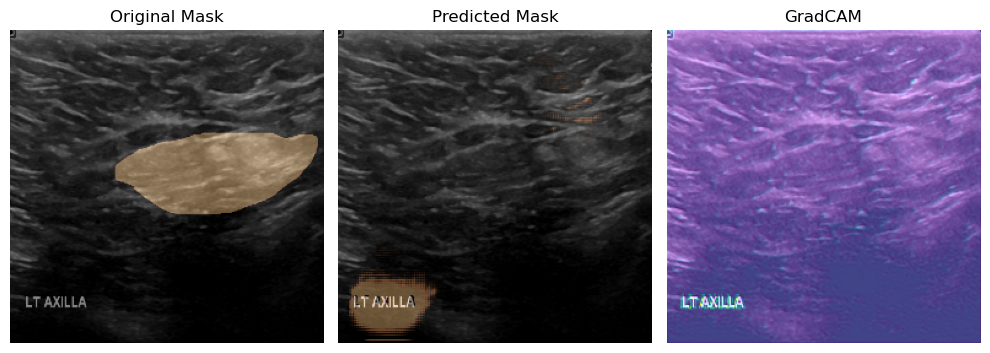

390/390 [==============================] - 1134s 3s/step - loss: 3.1070 - accuracy: 0.8546 - IoU: 0.4750 - val_loss: 11.3705 - val_accuracy: 0.9283 - val_IoU: 0.4964
Epoch 10/16
1/1 [==============================] - 0s 282ms/step loss: 2.2843 - accuracy: 0.8591 - IoU: 0.47


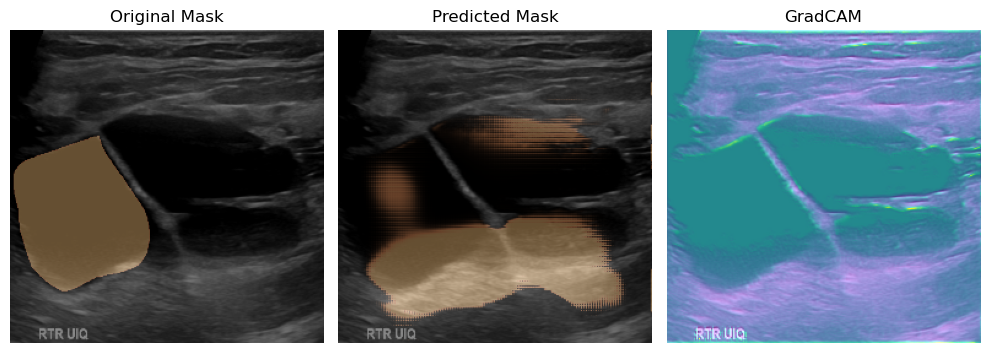

390/390 [==============================] - 1039s 3s/step - loss: 2.2843 - accuracy: 0.8591 - IoU: 0.4717 - val_loss: 13.2178 - val_accuracy: 0.8937 - val_IoU: 0.4921
Epoch 11/16
1/1 [==============================] - 1s 513ms/step loss: 6.2040 - accuracy: 0.8564 - IoU: 0.46


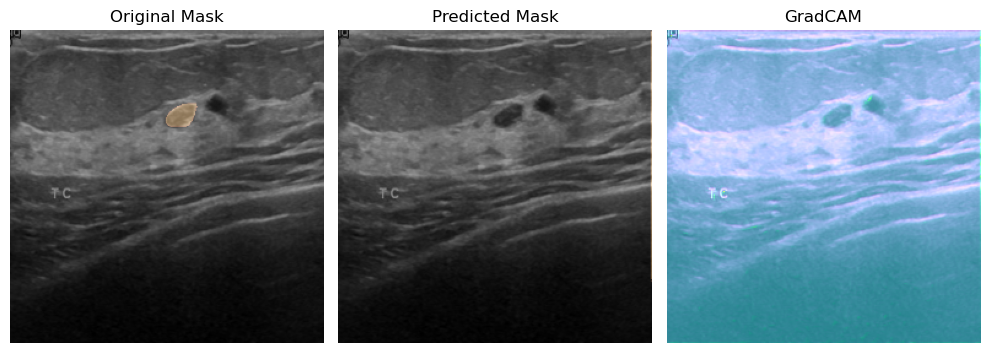

390/390 [==============================] - 1057s 3s/step - loss: 6.2040 - accuracy: 0.8564 - IoU: 0.4674 - val_loss: 20.6088 - val_accuracy: 0.9786 - val_IoU: 0.4897
Epoch 12/16
1/1 [==============================] - 0s 458ms/step loss: 9.9465 - accuracy: 0.8385 - IoU: 0.46


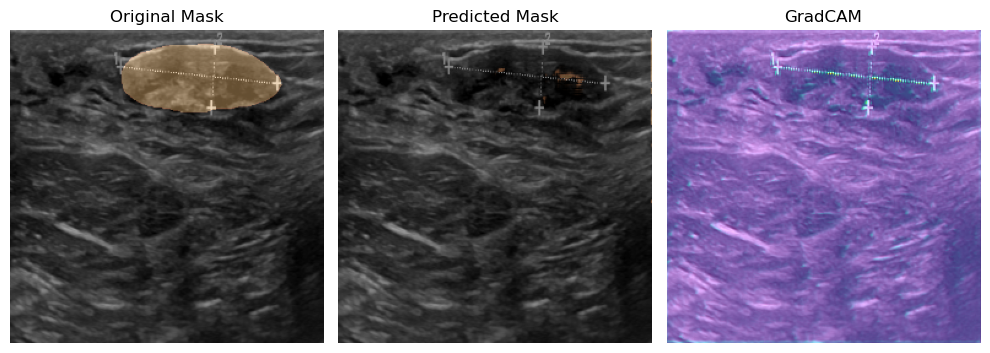

390/390 [==============================] - 1326s 3s/step - loss: 9.9465 - accuracy: 0.8385 - IoU: 0.4637 - val_loss: 11.2368 - val_accuracy: 0.9763 - val_IoU: 0.4886
Epoch 13/16
1/1 [==============================] - 1s 517ms/step


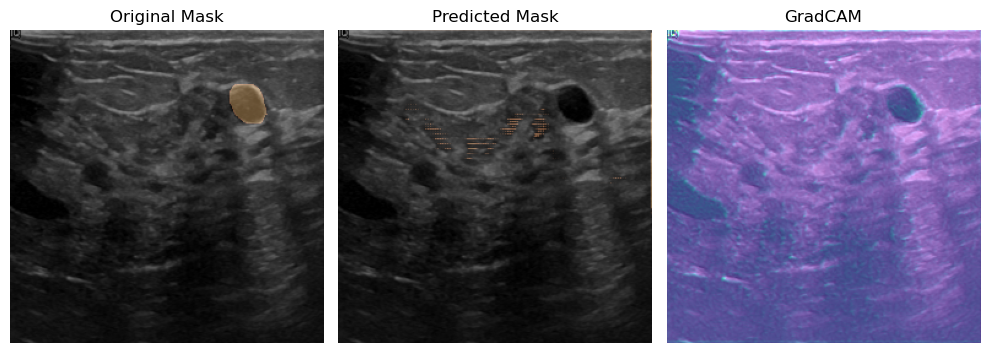

390/390 [==============================] - 900s 2s/step - loss: 4.0107 - accuracy: 0.8515 - IoU: 0.4719 - val_loss: 8.1673 - val_accuracy: 0.9724 - val_IoU: 0.4894


In [52]:
# Config Training
BATCH_SIZE = 2
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=16, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

In [53]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

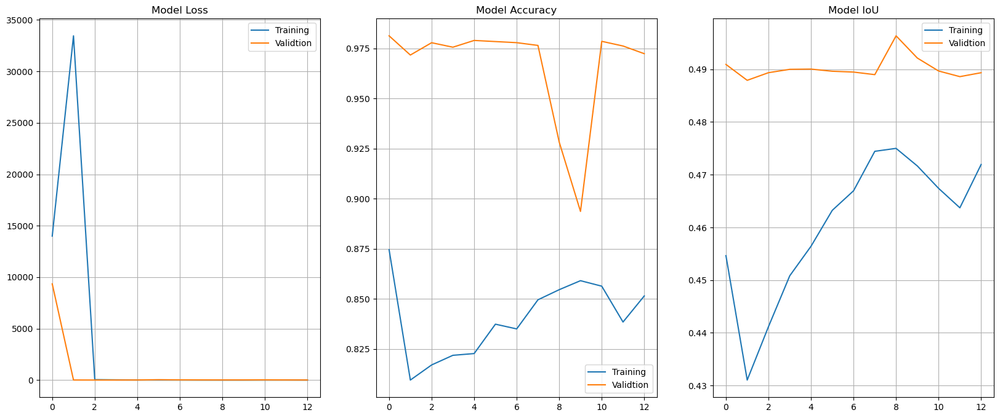

In [54]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

In [55]:
import pandas as pd

# Assuming you have the following variables:
# loss, accuracy, iou, val_loss, val_accuracy, val_iou

# Create a dictionary to store the metrics
metrics_dict = {
    'Loss': loss,
    'Accuracy': accuracy,
    'IoU': iou,
    'Validation Loss': val_loss,
    'Validation Accuracy': val_accuracy,
    'Validation IoU': val_iou
}

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame(metrics_dict)

# Display the DataFrame as a table
print(metrics_df)

            Loss  Accuracy       IoU  Validation Loss  Validation Accuracy  \
0   13991.328125  0.874591  0.454643      9353.539062             0.981338   
1   33457.496094  0.809476  0.431045         7.508394             0.971747   
2      43.880058  0.817023  0.441178         3.578994             0.977896   
3      19.826937  0.821833  0.450824         3.826360             0.975658   
4      11.969678  0.822708  0.456429         8.412814             0.979034   
5       9.720598  0.837377  0.463246        35.892620             0.978472   
6       8.224049  0.835015  0.466950        20.213385             0.977920   
7       4.231709  0.849548  0.474443        14.674939             0.976545   
8       3.106967  0.854600  0.474999        11.370493             0.928288   
9       2.284303  0.859092  0.471662        13.217771             0.893668   
10      6.204035  0.856352  0.467412        20.608765             0.978595   
11      9.946469  0.838452  0.463724        11.236804           

1/1 [==============================] - 0s 234ms/step


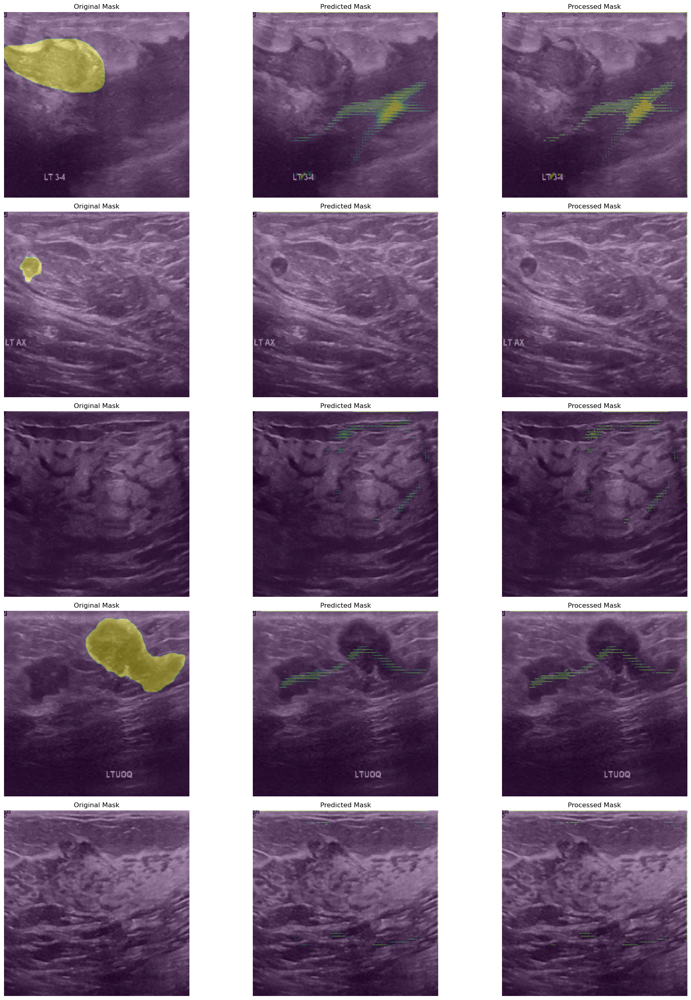

In [58]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()